In [1]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itertools import count
# Here i import important libraries such as pandas and networkx for extracting data(pandas)
# and networkx for representing our graph and using metrics from networkx libraries
# such that degree_centrality, betweennes_centrality, katz_centrlaity and eigenvector centrality
# Purpose of our project is to analyze the relationships between them using Instagram data from kaggle

In [2]:
data = pd.read_excel("Instagram_Data.xlsx", header = None)
data.head() #as we see the first column and the first row contain the names, which we must drop

,0,1,2,3,4,5,6,7,8,9,...,991,992,993,994,995,996,997,998,999,1000
0,NaN,Meredith Stransky,Brittney Mazzella,Yi Cook,Porter Devries,Suzanne Syverson,Ladawn Creason,Mikel Lamberson,Lakendra Lasiter,Kate Shiver,...,Tehmina,Happy Bacha,Younus,AVA,Alfred,Danish,Matloob,Sameed Shahzad,Frazer,Mubashir
1,Meredith Stransky,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Brittney Mazzella,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Yi Cook,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Porter Devries,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [3]:
#Dropping the first column and row containing the name to get adjacency matrix
data = data.drop(0, axis = 0)
data = data.drop(0, axis = 1)
data.head()

,1,2,3,4,5,6,7,8,9,10,...,991,992,993,994,995,996,997,998,999,1000
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
data.dtypes #object data type is not appropriate for our graph, so we will convert it to int

1       object
2       object
3       object
4       object
5       object
         ...  
996     object
997     object
998     object
999     object
1000    object
Length: 1000, dtype: object

In [5]:
#Converting to int64
data = data.astype('int64')
graph = nx.from_pandas_adjacency(data, nx.DiGraph) #Constructing our graph from adjacency matrix

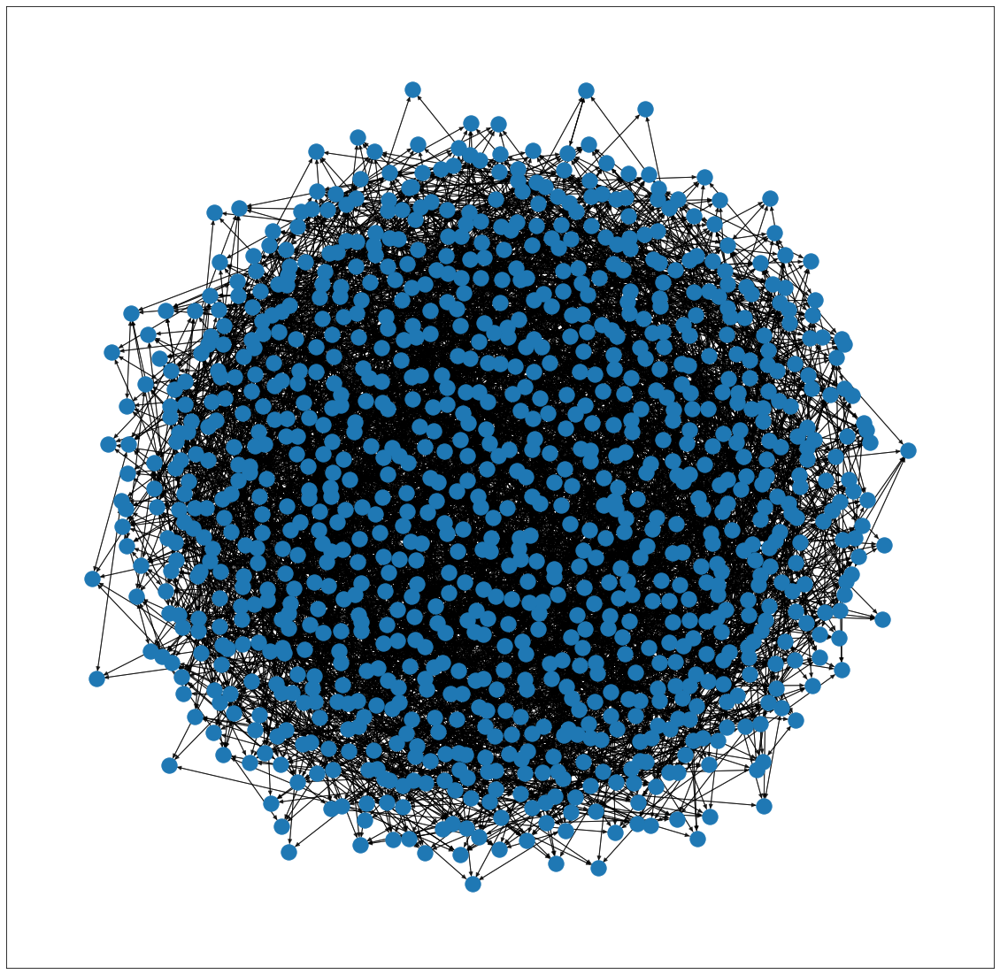

In [6]:
#Drawing graph
fig = plt.figure(figsize=(20, 20))
#I tested many layouts(planar, shell, bipartite, spectral, spring), and choosed the best one to our analysis
# kamada-kawai layout due to best drawing depend on centrality of graph and my big love to japanese culture :3
layout = nx.kamada_kawai_layout(graph)
nx.draw_networkx_edges(graph, layout, alpha=0.7)
nx.draw_networkx_nodes(graph, layout, nodesize=100)
plt.savefig("graph_pres.png")

In [7]:
#Extracting 5 types of centralities
degree_cent = nx.degree_centrality(graph)

between_cent = nx.betweenness_centrality(graph)

katz_cent = nx.katz_centrality_numpy(graph)

eig_cent = nx.eigenvector_centrality(graph)

closeness_cent = nx.closeness_centrality(graph)

In [8]:
#Setting attributes for our node
nx.set_node_attributes(graph, degree_cent, "degree")
nx.set_node_attributes(graph, between_cent, "between")
nx.set_node_attributes(graph, katz_cent, "katz")
nx.set_node_attributes(graph, eig_cent, "eigen")
nx.set_node_attributes(graph, closeness_cent, "close")

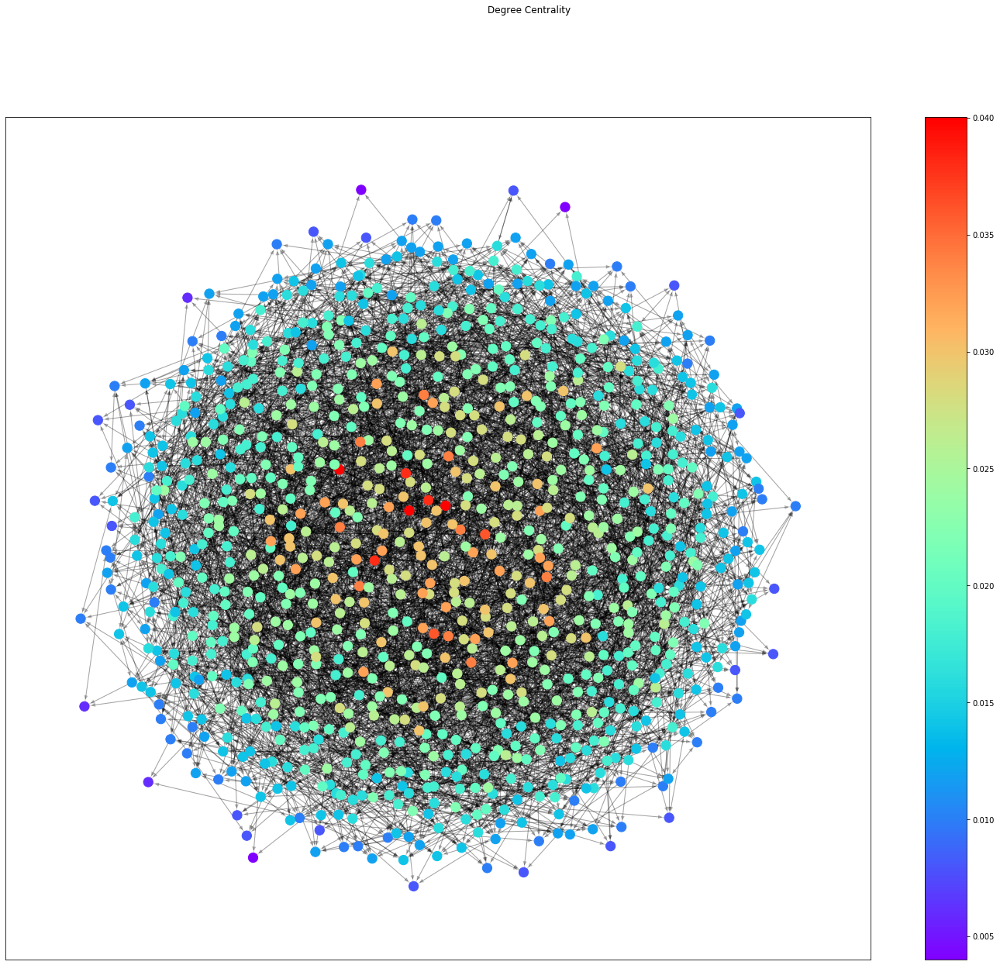

In [9]:
#Degree centrality
att = nx.get_node_attributes(graph, "degree")
nodes = graph.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality")
node_col = nx.draw_networkx_nodes(graph, layout, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph, layout, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality.png")

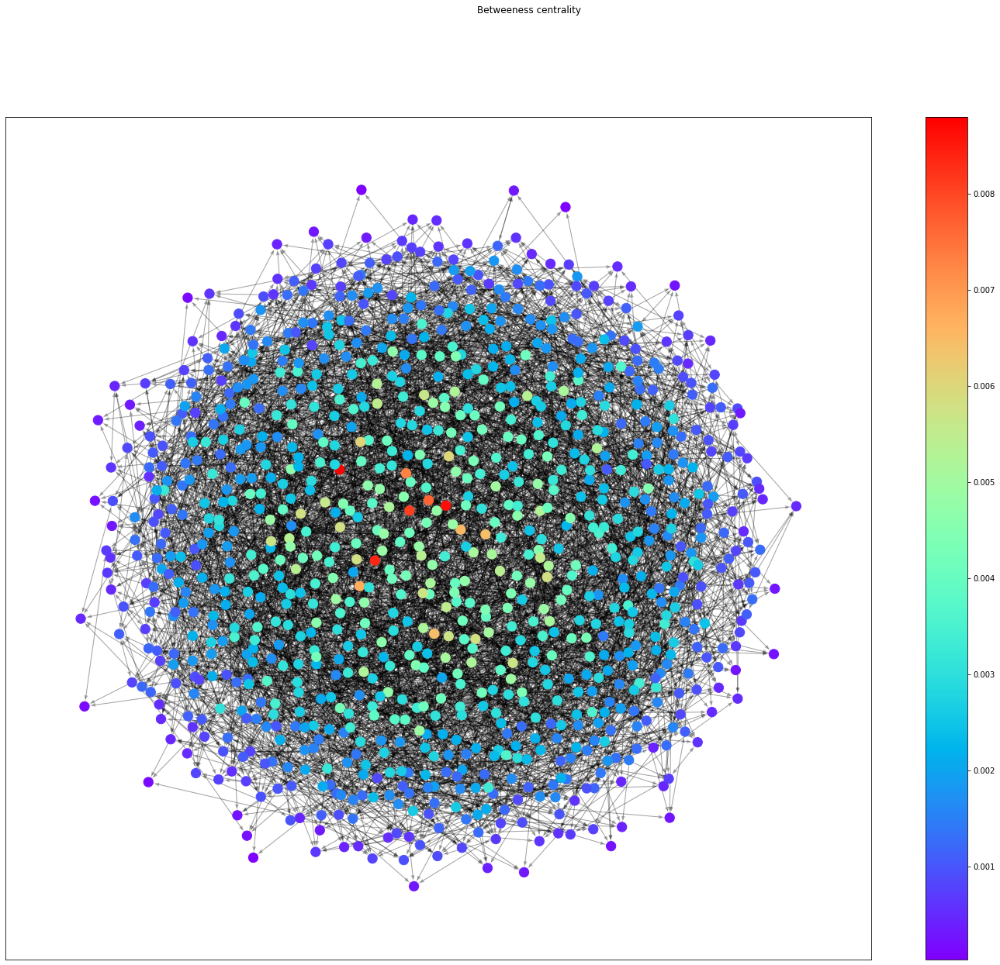

In [10]:
#Betweeness centrality
att = nx.get_node_attributes(graph, "between")
nodes = graph.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Betweeness centrality")
node_col = nx.draw_networkx_nodes(graph, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality.png")

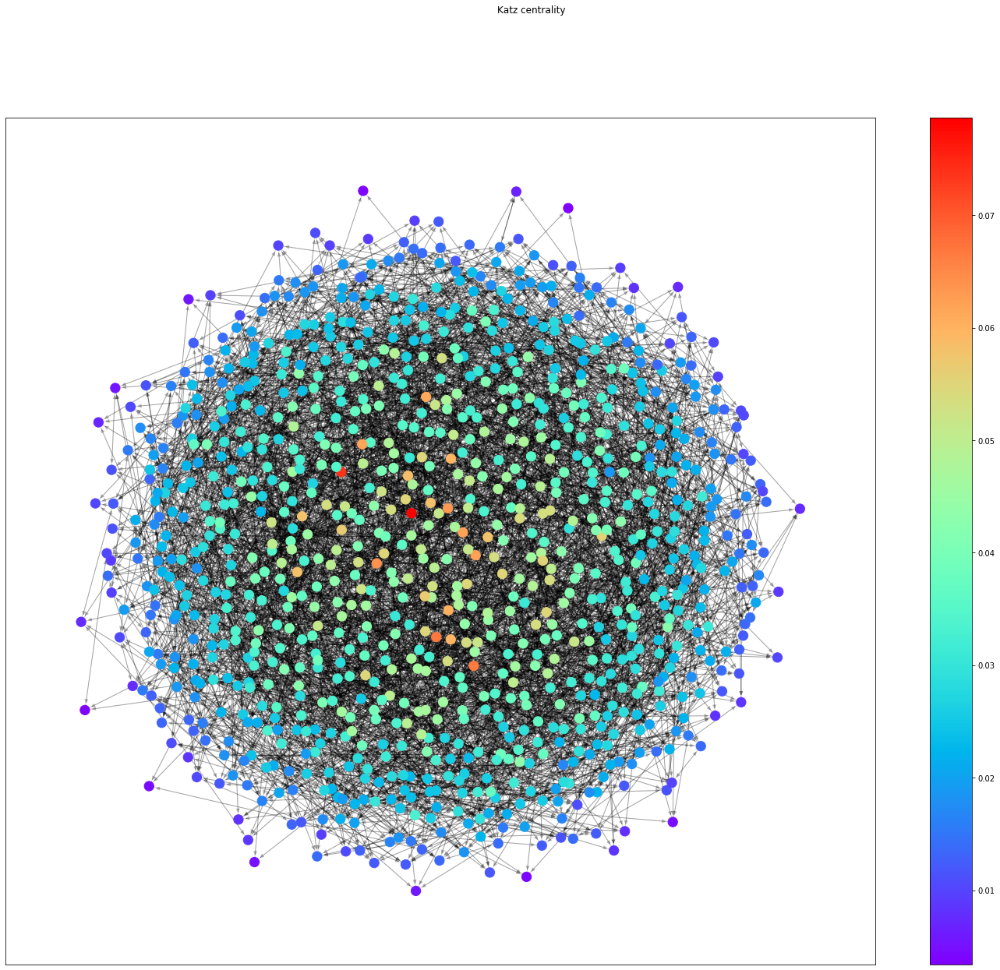

In [11]:
#Katz centrality
att = nx.get_node_attributes(graph, "katz")
nodes = graph.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Katz centrality")
node_col = nx.draw_networkx_nodes(graph, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Katz_centrality.png")

<Figure size 432x288 with 0 Axes>

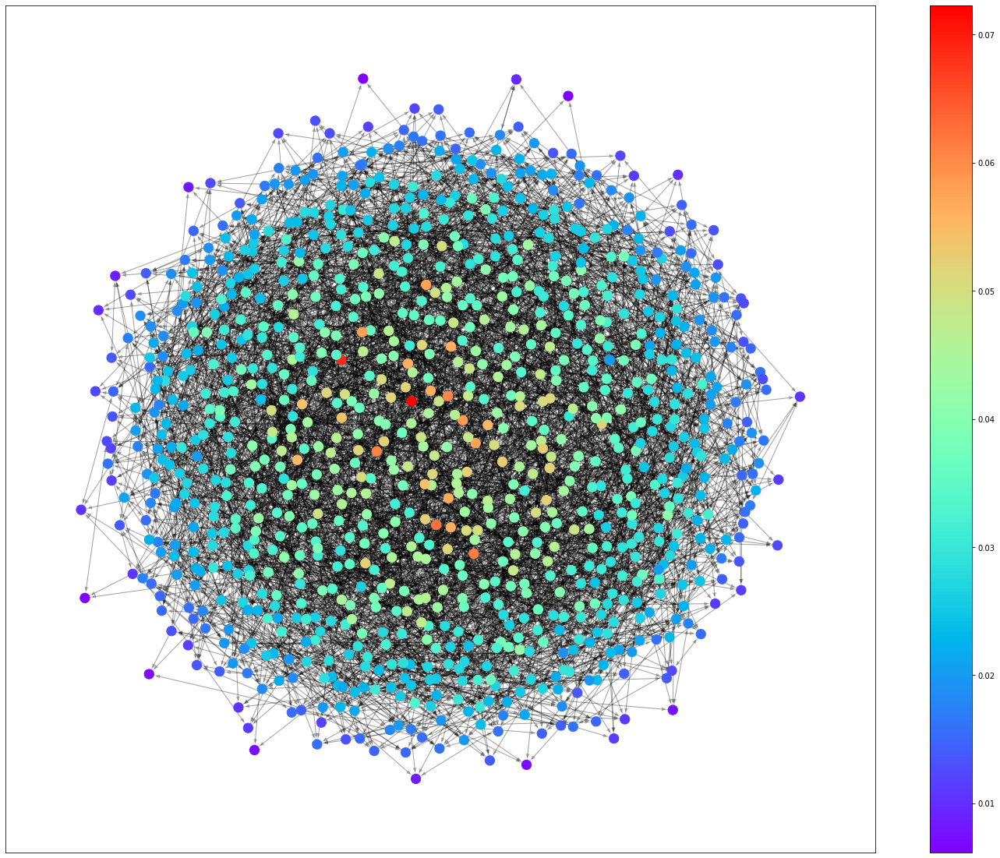

In [12]:
#Eigenvector centrality
att = nx.get_node_attributes(graph, "eigen")
nodes = graph.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph)
plt.suptitle("Eigenvector centrality")
fig = plt.figure(figsize=(25, 20))
node_col = nx.draw_networkx_nodes(graph, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality.png")

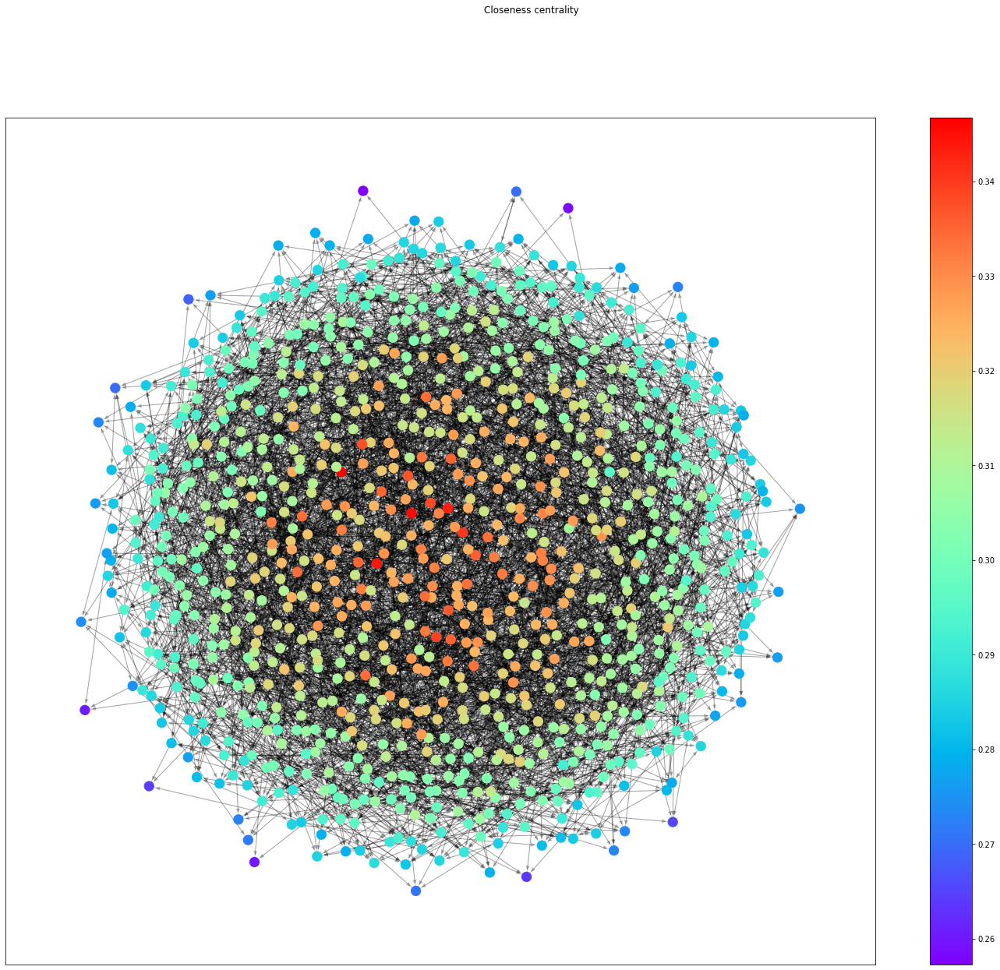

In [13]:
#Closeness centrality
att = nx.get_node_attributes(graph, "close")
nodes = graph.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph)
fig = plt.figure(figsize=(25, 20))
plt.suptitle("Closeness centrality")
node_col = nx.draw_networkx_nodes(graph, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality.png")

In [14]:
def cum_sum_attr(graph, attribute_name):
    attr = nx.get_node_attributes(graph, attribute_name) # get attribute
    cum_sum = 0
    for i in attr:
        cum_sum += attr[i]
    return cum_sum

In [15]:
diameter = nx.diameter(graph)
density = nx.density(graph)
sh_path_length = nx.average_shortest_path_length(graph)
print("The graph diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph, "eigen"))

The graph diameter:     5
Density:                0.009875875875875876
Shortest path length:   3.273137137137137
Degree Centrality:      19.751751751751733
Closeness centrality:   306.2468526358195
Betweeness Centrality:  2.2776925221815043
Katz Centrality:        29.135658105710963
EigenVector centrality: 29.693914541796758


In [16]:
def extract(graph, attribute_name, percent):
    attr = nx.get_node_attributes(graph, attribute_name)
    attr_sorted = sorted(attr, key=between_cent.get, reverse = True) #Sorting them reversed because it begin from 1000 id
    attr_total_val = cum_sum_attr(graph, attribute_name) * percent
    attr_total_cur = 0
    for i in range(len(attr_sorted)):
        if attr_total_cur >= attr_total_val:
            break
        attr_total_cur += attr[attr_sorted[i]]
    return attr_sorted[:i]

# Degree Centrality Analysis

In [17]:
degree_cent_nodes = extract(graph, "degree", 0.8) #Selecting nodes which contribute to 80% of cumulative sum
                                                  #(we will repeat this process to every metric)

In [18]:
removed = len(graph) - len(degree_cent_nodes)     #Removing nodes from our analysis(also repeatable process to every metric)
print("We removed", removed, "nodes from graph")

We removed 307 nodes from graph


In [19]:
graph_deg = graph.copy()
graph_deg.remove_nodes_from(degree_cent_nodes)

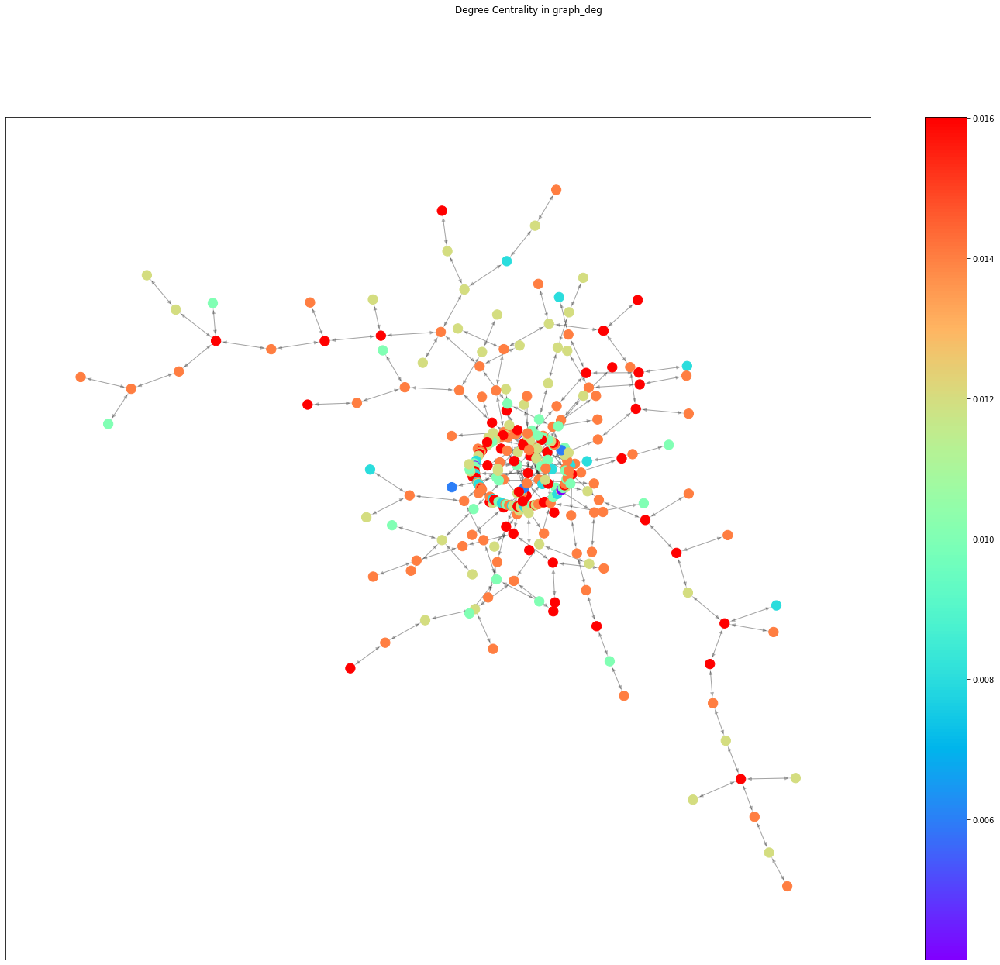

In [20]:
att = nx.get_node_attributes(graph_deg, "degree")
nodes = graph_deg.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_deg)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality in graph_deg")
node_col = nx.draw_networkx_nodes(graph_deg, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_deg, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality_graph_deg.png")

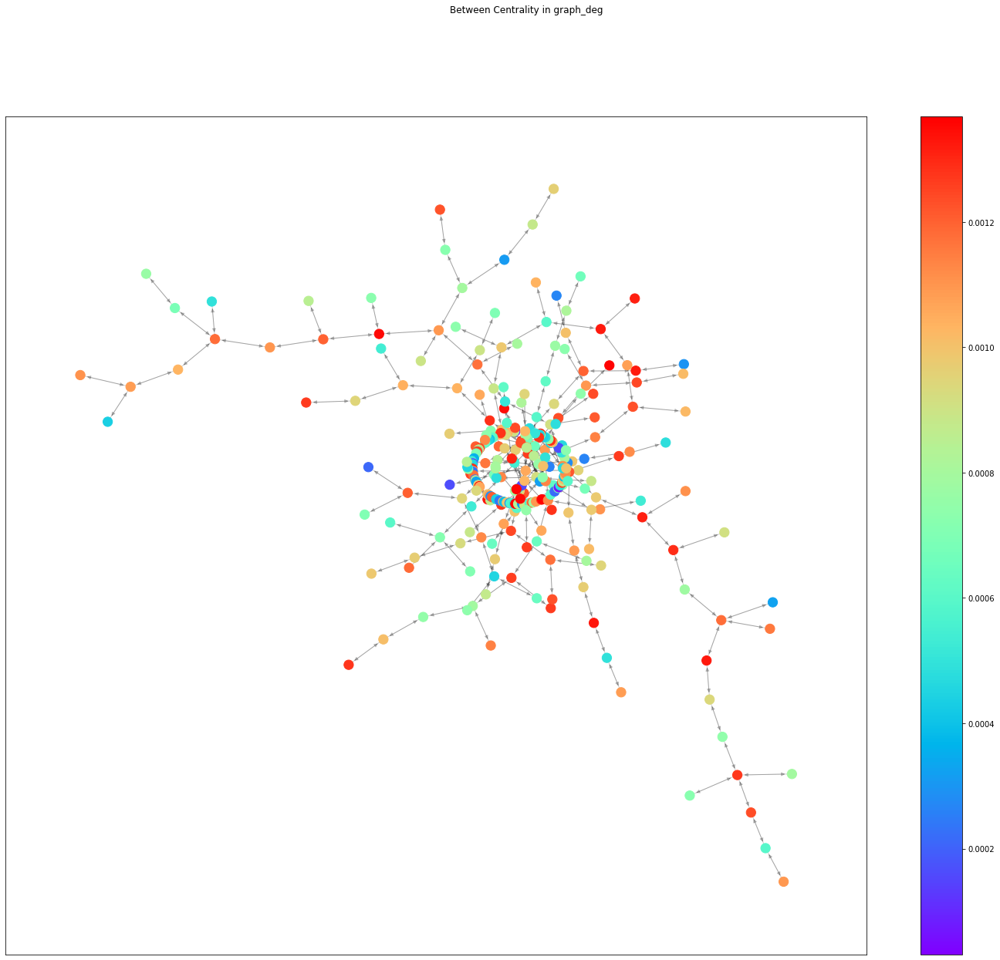

In [21]:
att = nx.get_node_attributes(graph_deg, "between")
nodes = graph_deg.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_deg)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Between Centrality in graph_deg")
node_col = nx.draw_networkx_nodes(graph_deg, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_deg, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality_graph_deg.png")

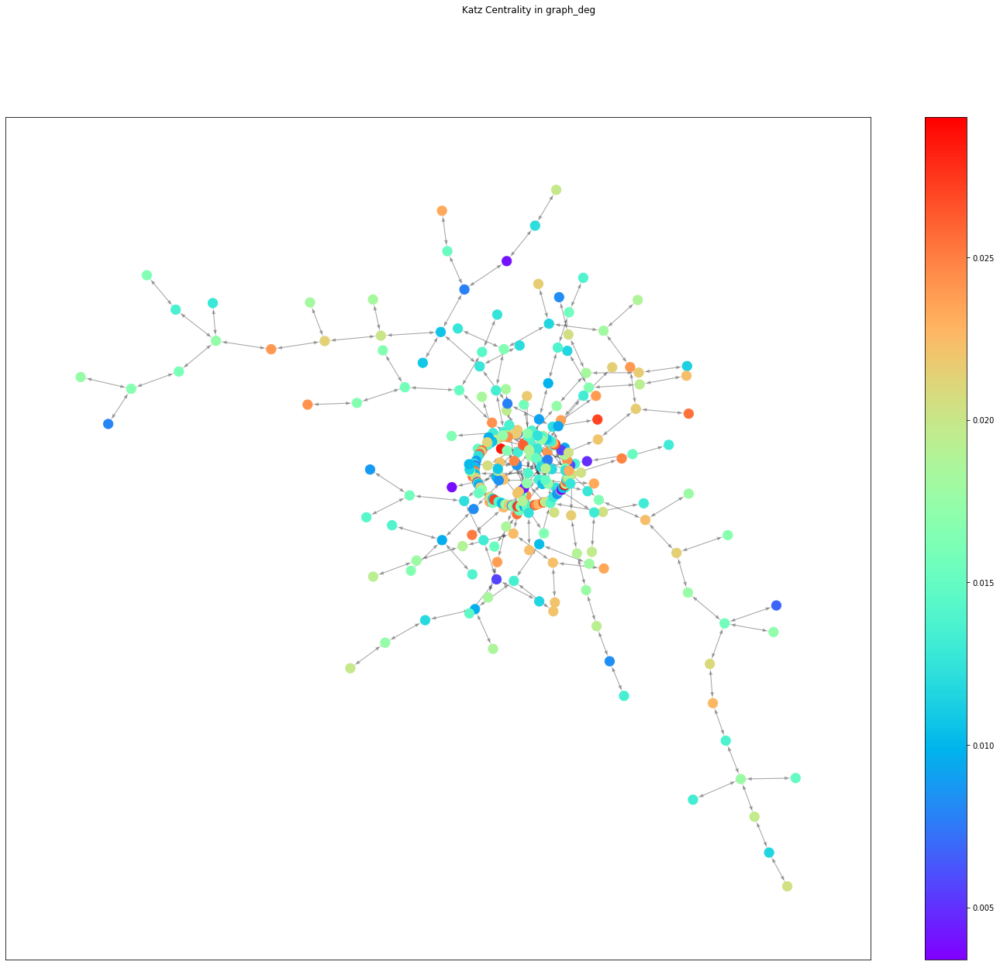

In [22]:
att = nx.get_node_attributes(graph_deg, "katz")
nodes = graph_deg.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_deg)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Katz Centrality in graph_deg")
node_col = nx.draw_networkx_nodes(graph_deg, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_deg, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Katz_centrality_graph_deg.png")

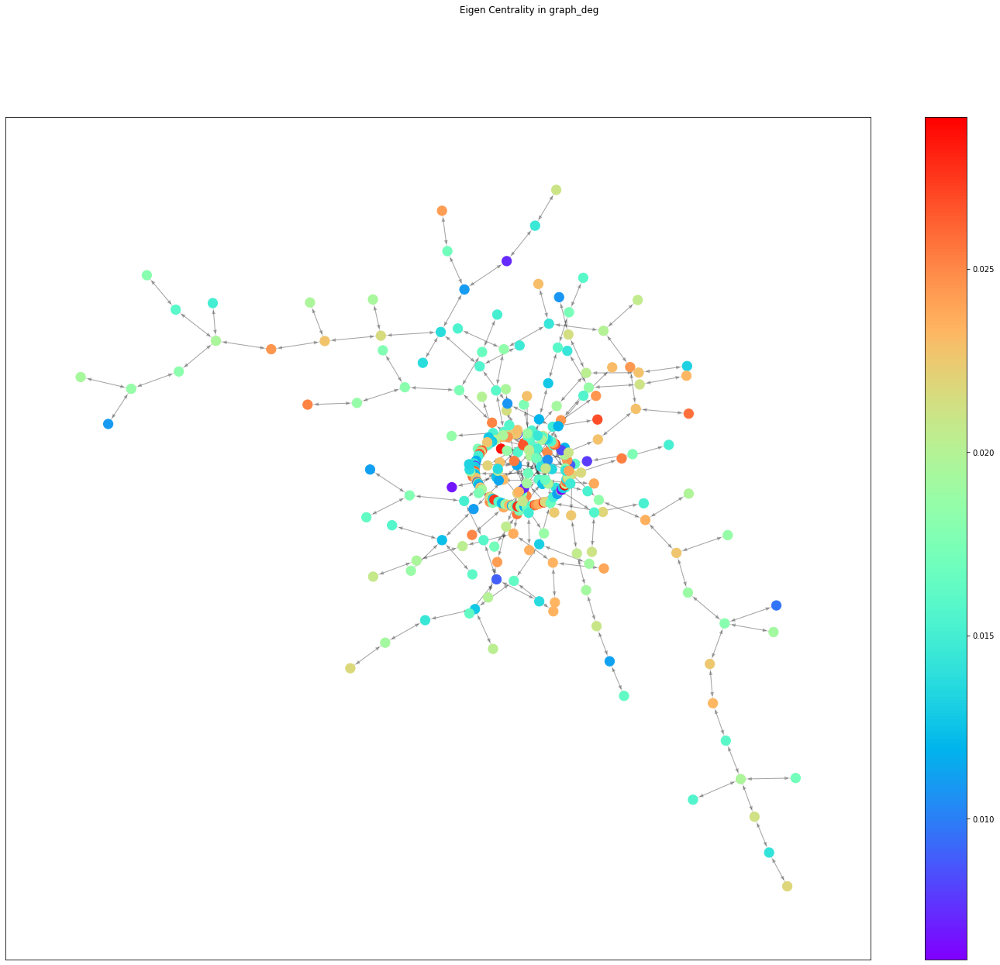

In [23]:
att = nx.get_node_attributes(graph_deg, "eigen")
nodes = graph_deg.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_deg)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Eigen Centrality in graph_deg")
node_col = nx.draw_networkx_nodes(graph_deg, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_deg, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality_graph_deg.png")

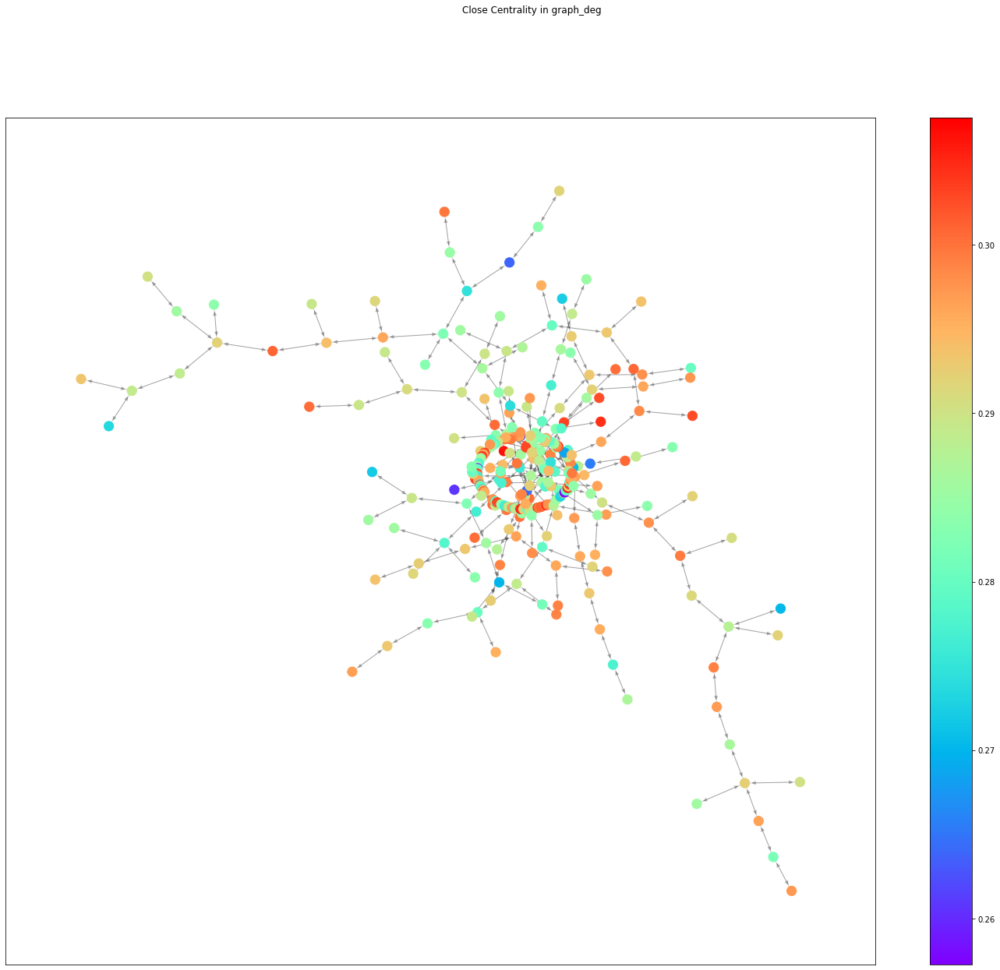

In [24]:
att = nx.get_node_attributes(graph_deg, "close")
nodes = graph_deg.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_deg)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Close Centrality in graph_deg")
node_col = nx.draw_networkx_nodes(graph_deg, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_deg, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality_graph_deg.png")

In [25]:
density = nx.density(graph_deg)
print("The graph_deg diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph_deg, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph_deg, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph_deg, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph_deg, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph_deg, "eigen"))

The graph_deg diameter:     5
Density:                0.004087628536756722
Shortest path length:   3.273137137137137
Degree Centrality:      3.9439439439439425
Closeness centrality:   88.90439689916666
Betweeness Centrality:  0.26766295188296063
Katz Centrality:        5.11576088075858
EigenVector centrality: 5.6597264133737895


# Betweeness Centrality Analysis

In [26]:
between_cent_nodes = extract(graph, "between", 0.8)

In [27]:
removed = len(graph) - len(between_cent_nodes)
print("We removed", removed, "nodes from graph")

We removed 427 nodes from graph


In [28]:
graph_bet = graph.copy()
graph_bet.remove_nodes_from(between_cent_nodes)

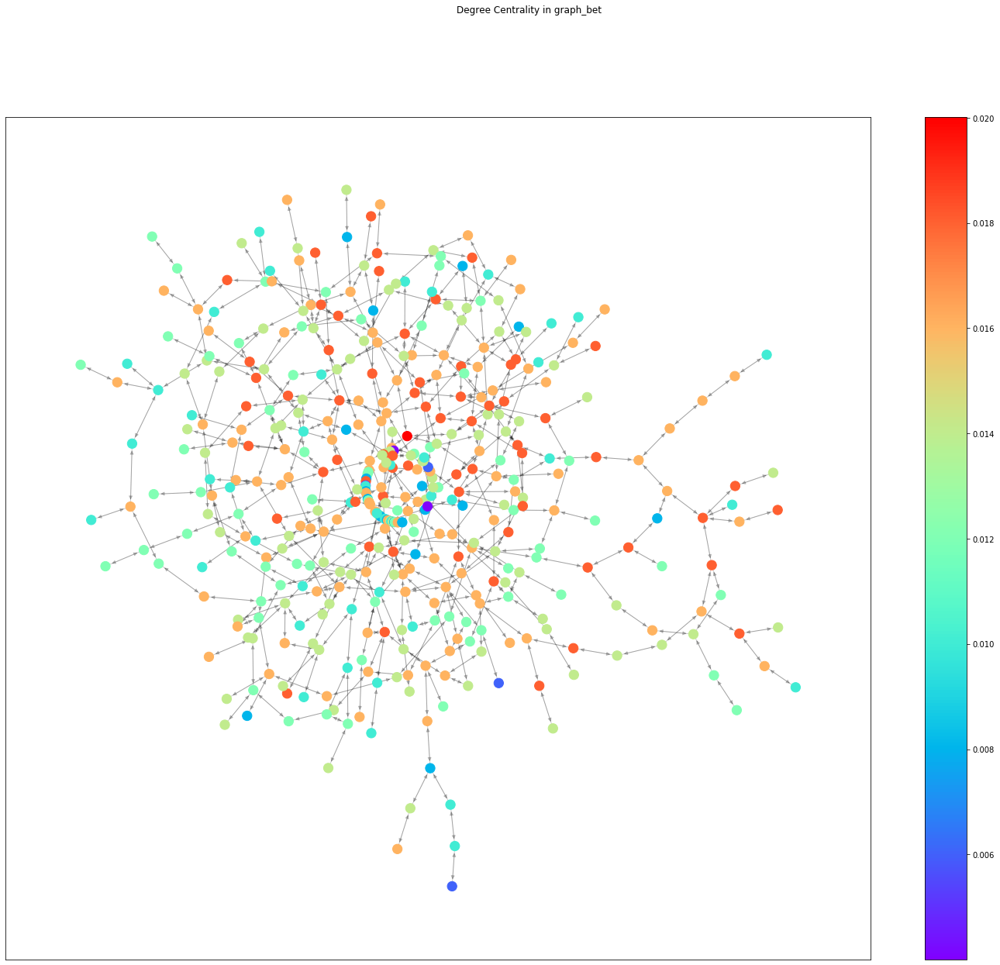

In [29]:
att = nx.get_node_attributes(graph_bet, "degree")
nodes = graph_bet.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_bet)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality in graph_bet")
node_col = nx.draw_networkx_nodes(graph_bet, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_bet, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality_graph_bet.png")

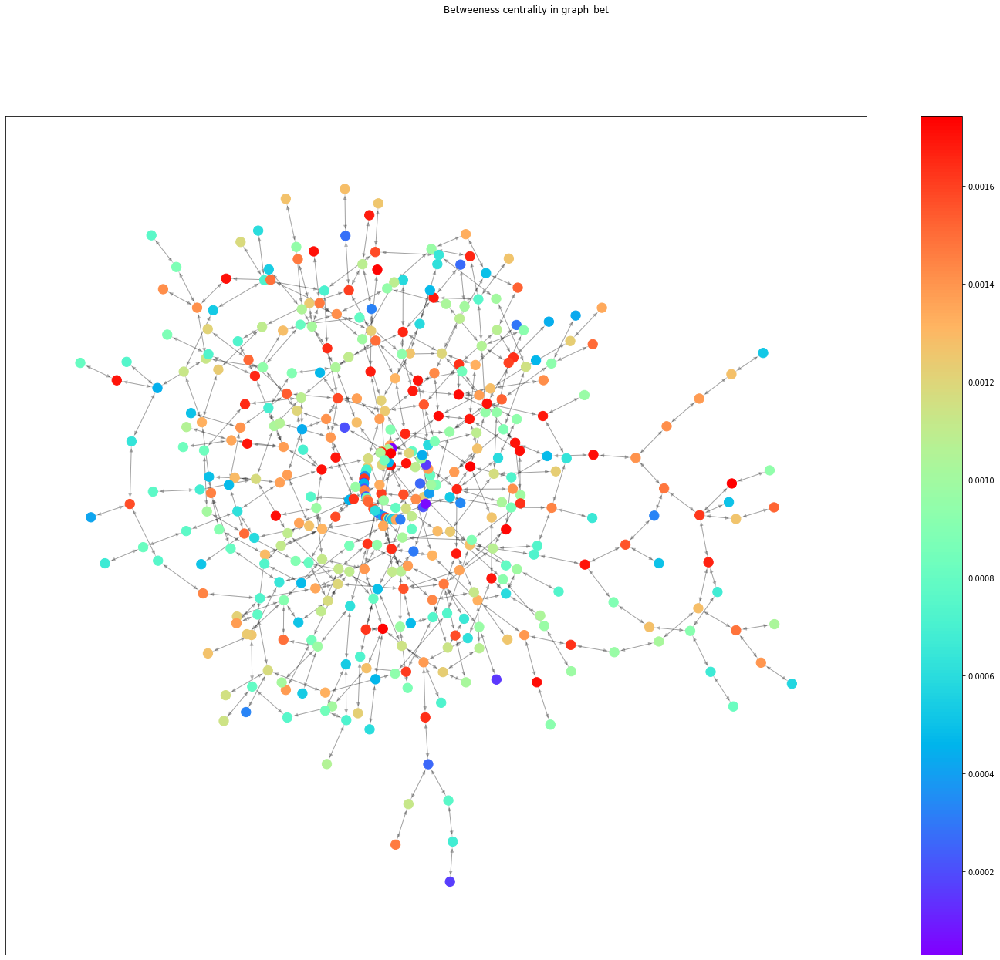

In [30]:
#Betweeness centrality
att = nx.get_node_attributes(graph_bet, "between")
nodes = graph_bet.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_bet)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Betweeness centrality in graph_bet")
node_col = nx.draw_networkx_nodes(graph_bet, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_bet, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality_graph_bet.png")

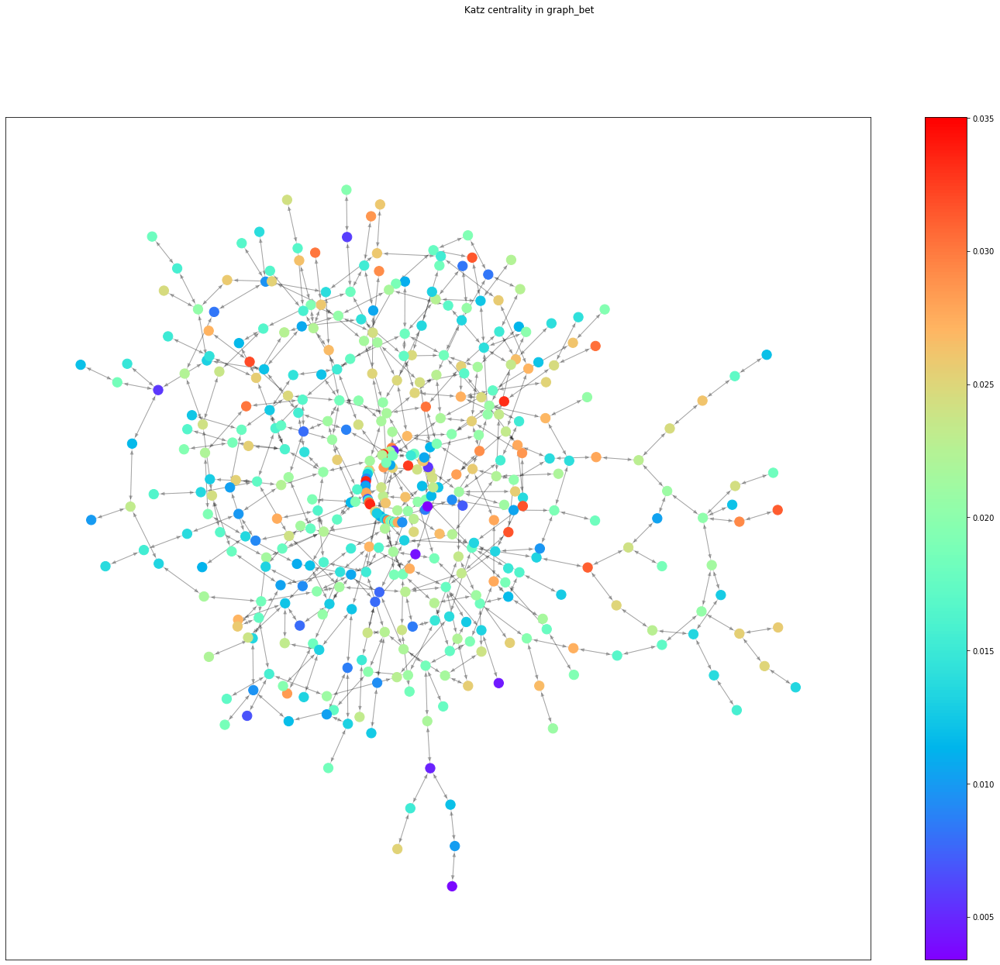

In [31]:
#Katz centrality
att = nx.get_node_attributes(graph_bet, "katz")
nodes = graph_bet.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_bet)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Katz centrality in graph_bet")
node_col = nx.draw_networkx_nodes(graph_bet, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_bet, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Katz_centrality_graph_katz.png")

<Figure size 432x288 with 0 Axes>

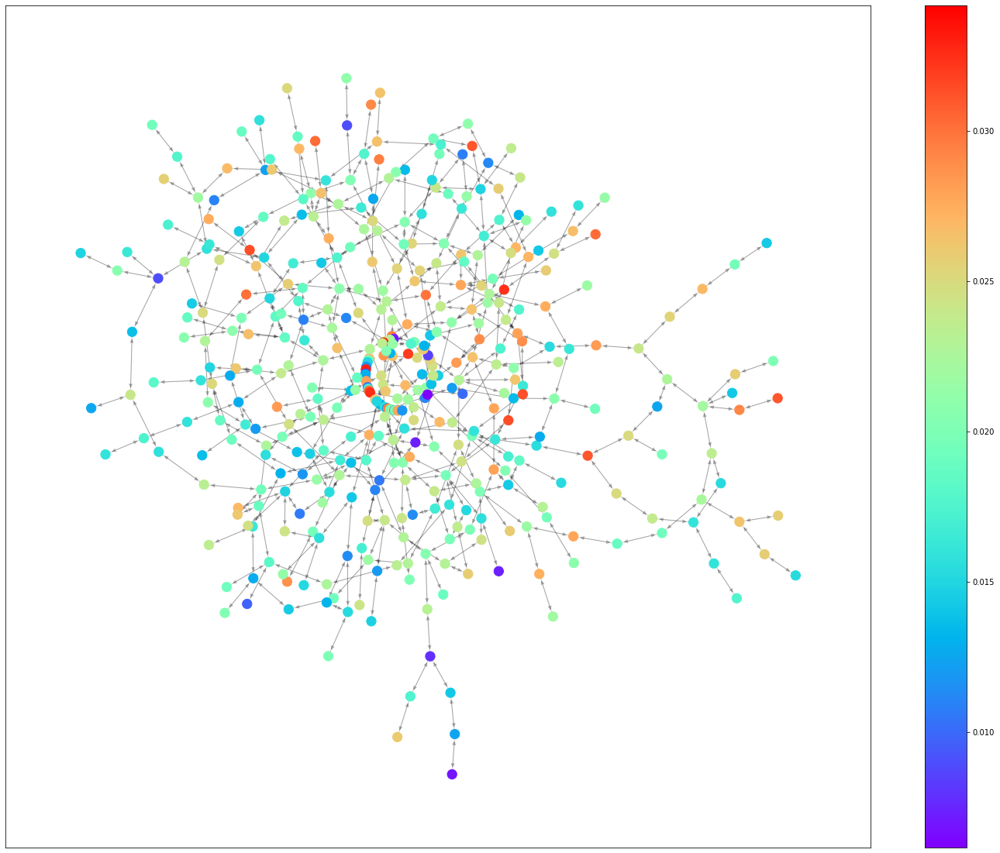

In [32]:
#Eigenvector centrality
att = nx.get_node_attributes(graph_bet, "eigen")
nodes = graph_bet.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_bet)
plt.suptitle("Eigenvector centrality in graph_bet")
fig = plt.figure(figsize=(25, 20))
node_col = nx.draw_networkx_nodes(graph_bet, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_bet, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality_graph_bet.png")

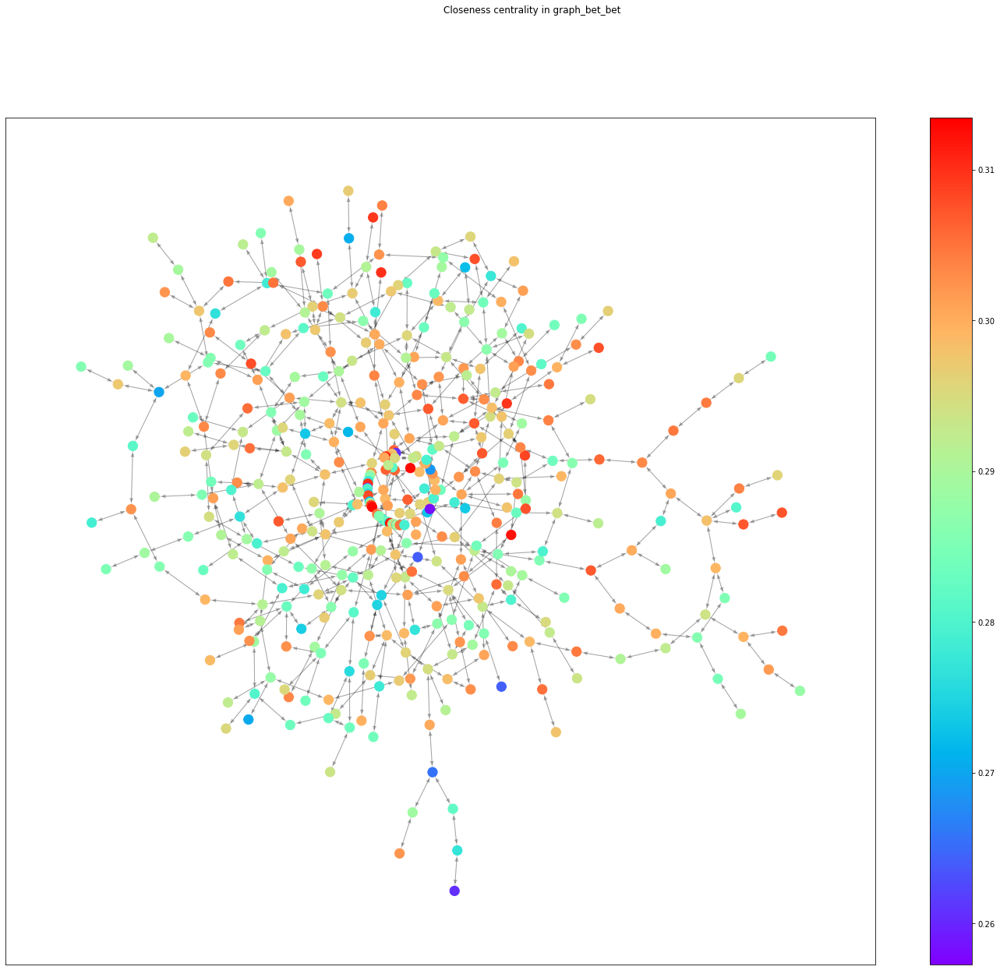

In [33]:
#Closeness centrality
att = nx.get_node_attributes(graph_bet, "close")
nodes = graph_bet.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_bet)
fig = plt.figure(figsize=(25, 20))
plt.suptitle("Closeness centrality in graph_bet_bet")
node_col = nx.draw_networkx_nodes(graph_bet, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_bet, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality_graph_bet.png")

In [34]:
density = nx.density(graph_bet)
print("The graph_bet diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph_bet, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph_bet, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph_bet, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph_bet, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph_bet, "eigen"))

The graph_bet diameter:     5
Density:                0.005013688689514134
Shortest path length:   3.273137137137137
Degree Centrality:      5.999999999999999
Closeness centrality:   125.1961919017603
Betweeness Centrality:  0.45509005629514293
Katz Centrality:        8.075678554348308
EigenVector centrality: 8.737919359406446


# Closeness centrality analysis

In [35]:
close_cent_nodes = extract(graph, "close", 0.8)

In [36]:
removed = len(graph) - len(close_cent_nodes)
print("We removed", removed, "nodes from graph")

We removed 213 nodes from graph


In [37]:
graph_close = graph.copy()
graph_close.remove_nodes_from(close_cent_nodes)

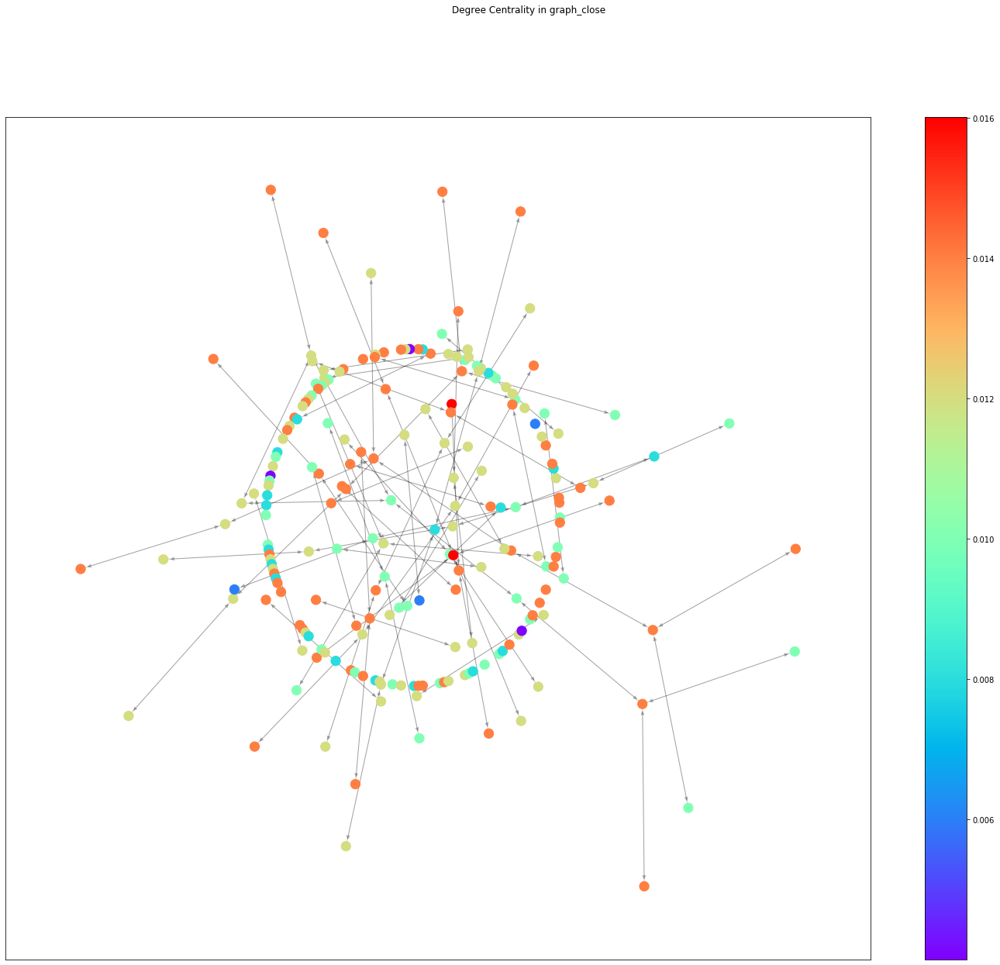

In [38]:
att = nx.get_node_attributes(graph_close, "degree")
nodes = graph_close.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_close)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_close, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_close, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality_graph_close.png")

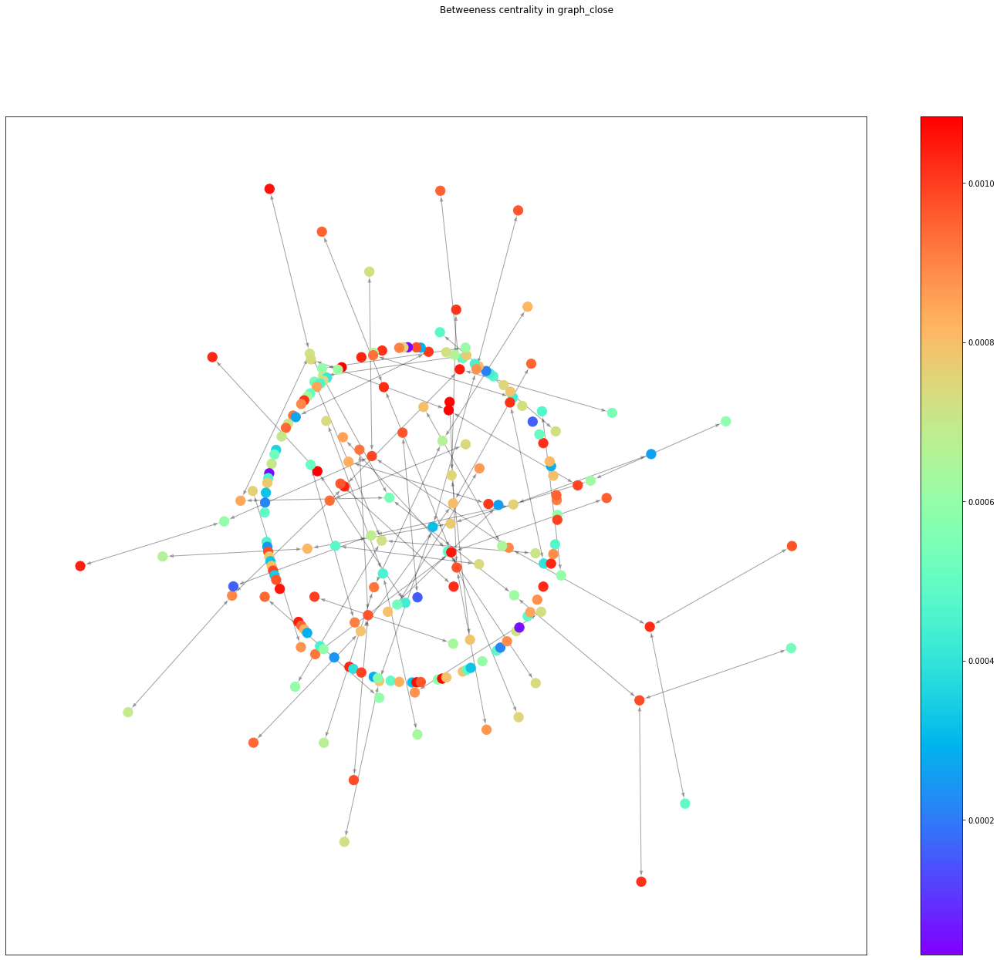

In [39]:
att = nx.get_node_attributes(graph_close, "between")
nodes = graph_close.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_close)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Betweeness centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_close, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_close, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality_graph_close.png")

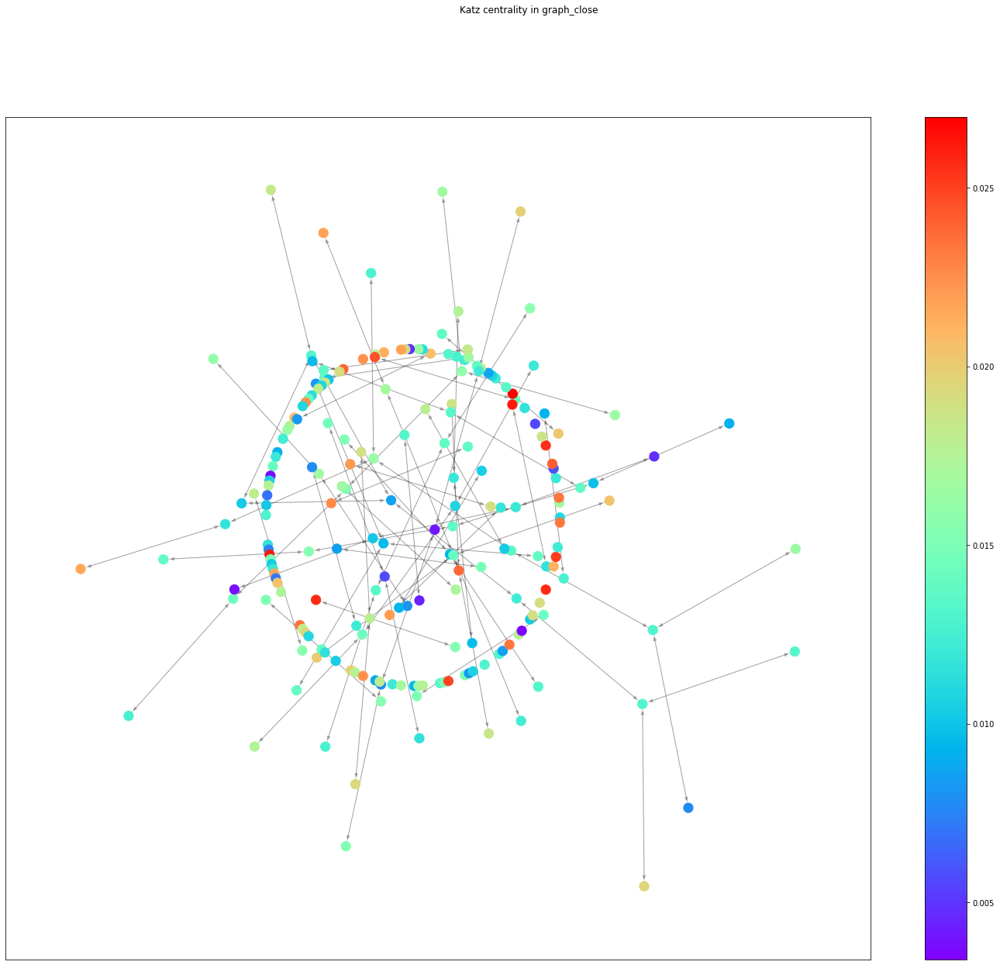

In [40]:
att = nx.get_node_attributes(graph_close, "katz")
nodes = graph_close.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_close)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Katz centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_close, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_close, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Katz_centrality_graph_close.png")

<Figure size 432x288 with 0 Axes>

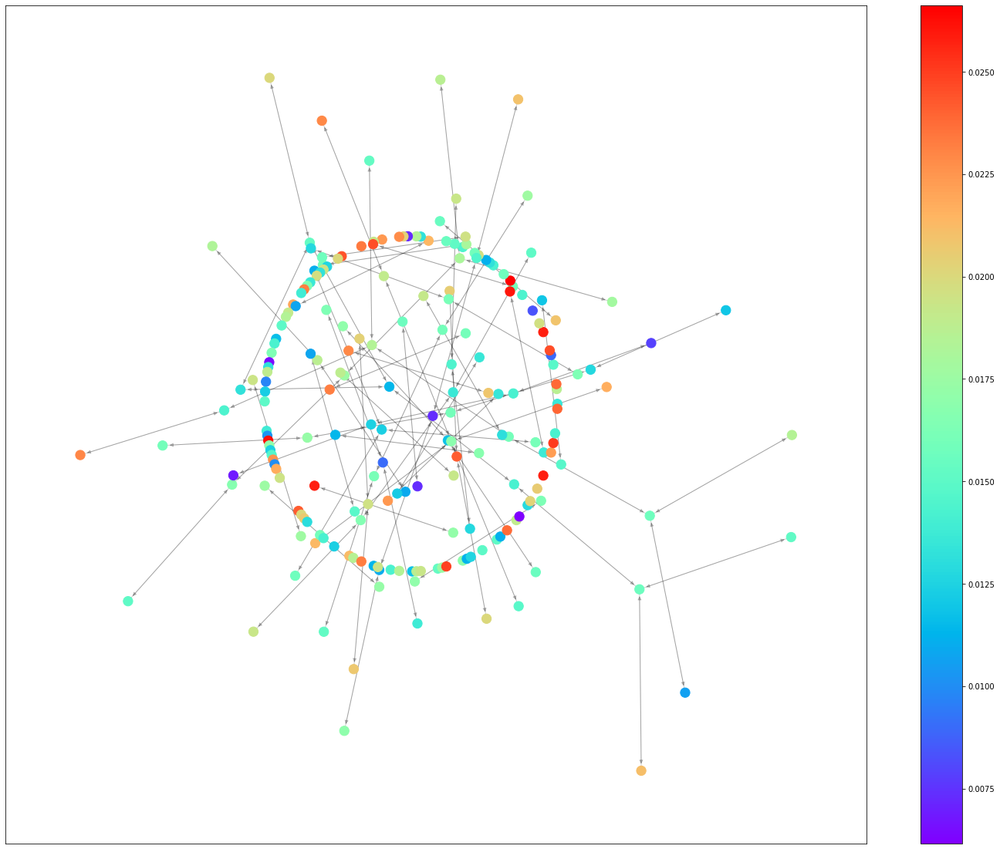

In [41]:
#Eigenvector centrality
att = nx.get_node_attributes(graph_close, "eigen")
nodes = graph_close.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_close)
plt.suptitle("Eigenvector centrality in graph_close")
fig = plt.figure(figsize=(25, 20))
node_col = nx.draw_networkx_nodes(graph_close, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_close, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality_graph_close.png")

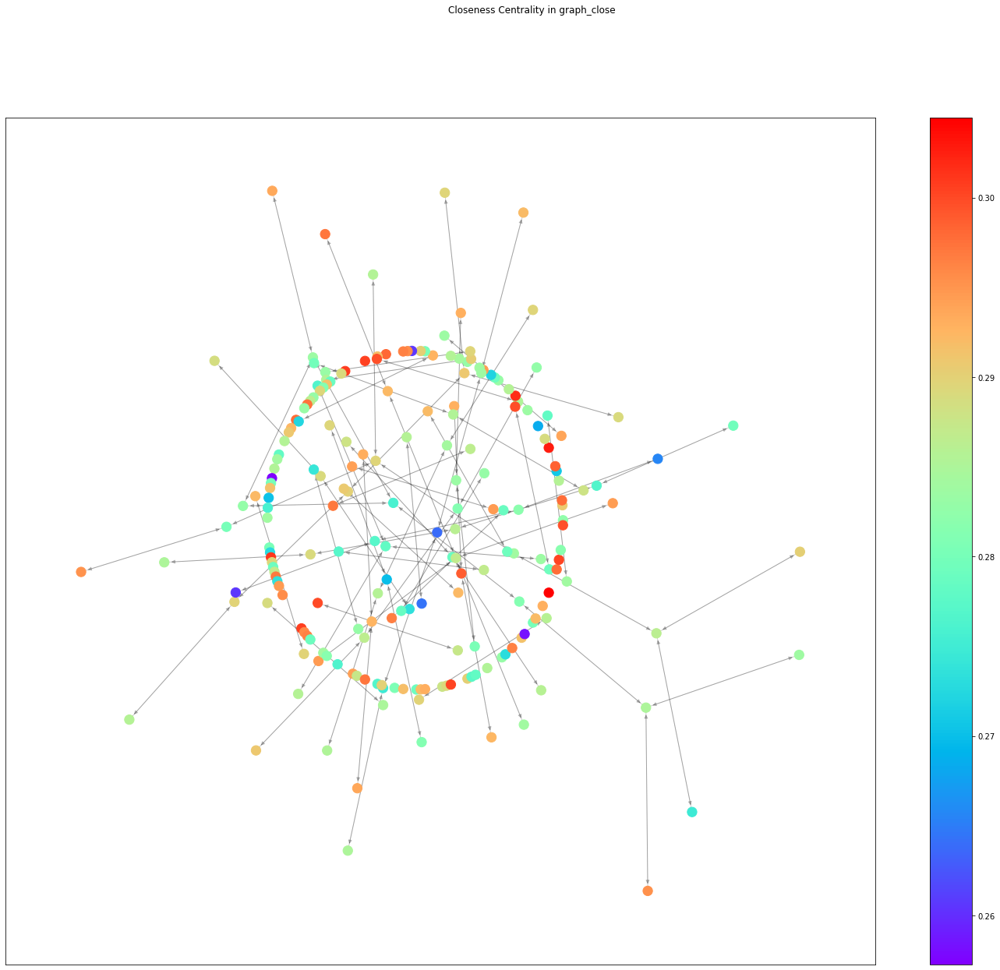

In [42]:
att = nx.get_node_attributes(graph_close, "close")
nodes = graph_close.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_close)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Closeness Centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_close, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_close, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality.png")

In [43]:
density = nx.density(graph_close)
print("The graph_close diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph_close, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph_close, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph_close, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph_close, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph_close, "eigen"))

The graph_close diameter:     5
Density:                0.0034989813092390822
Shortest path length:   3.273137137137137
Degree Centrality:      2.502502502502499
Closeness centrality:   60.96937660878829
Betweeness Centrality:  0.15272709754981095
Katz Centrality:        3.1381732414557066
EigenVector centrality: 3.5518385691107923


# Katz Centrality Analysis

In [44]:
katz_cent_nodes = extract(graph, "katz", 0.8)

In [45]:
removed = len(graph) - len(katz_cent_nodes)
print("We removed", removed, "nodes from graph")

We removed 337 nodes from graph


In [46]:
graph_katz = graph.copy()
graph_katz.remove_nodes_from(katz_cent_nodes)

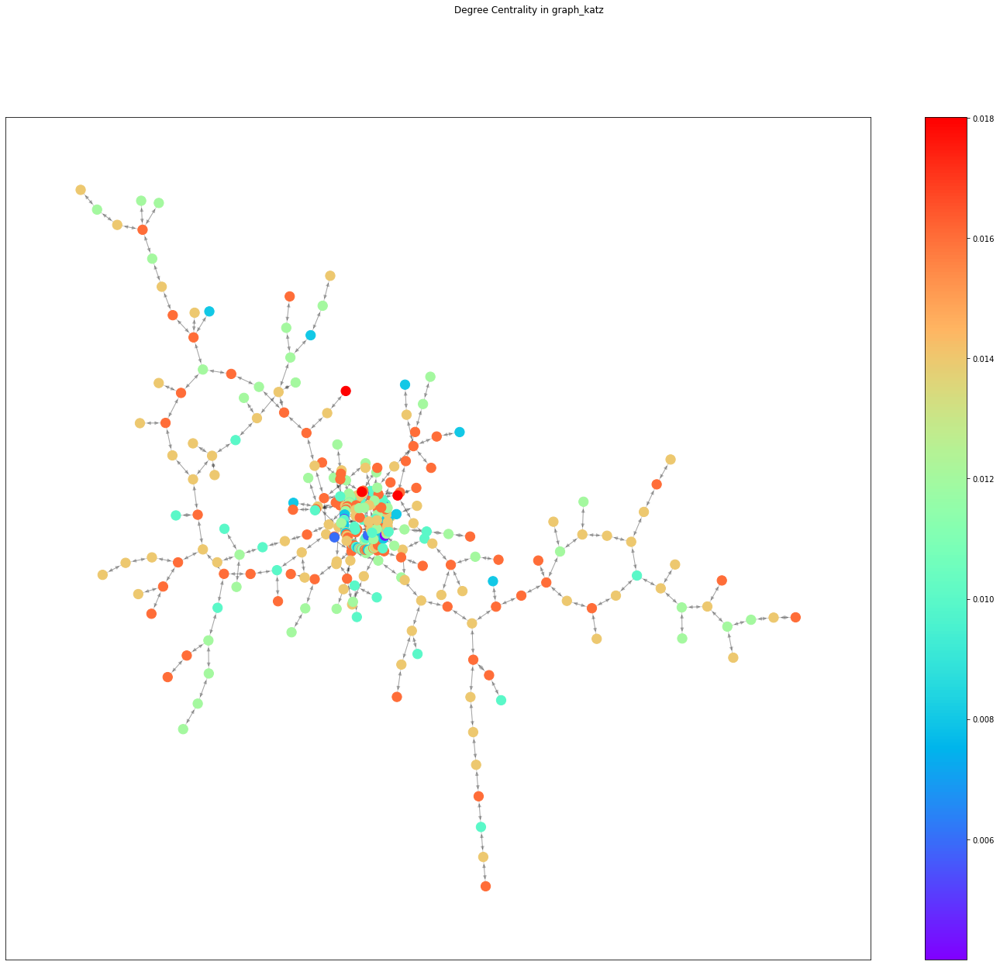

In [47]:
att = nx.get_node_attributes(graph_katz, "degree")
nodes = graph_katz.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_katz)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality in graph_katz")
node_col = nx.draw_networkx_nodes(graph_katz, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_katz, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality_graph_katz.png")

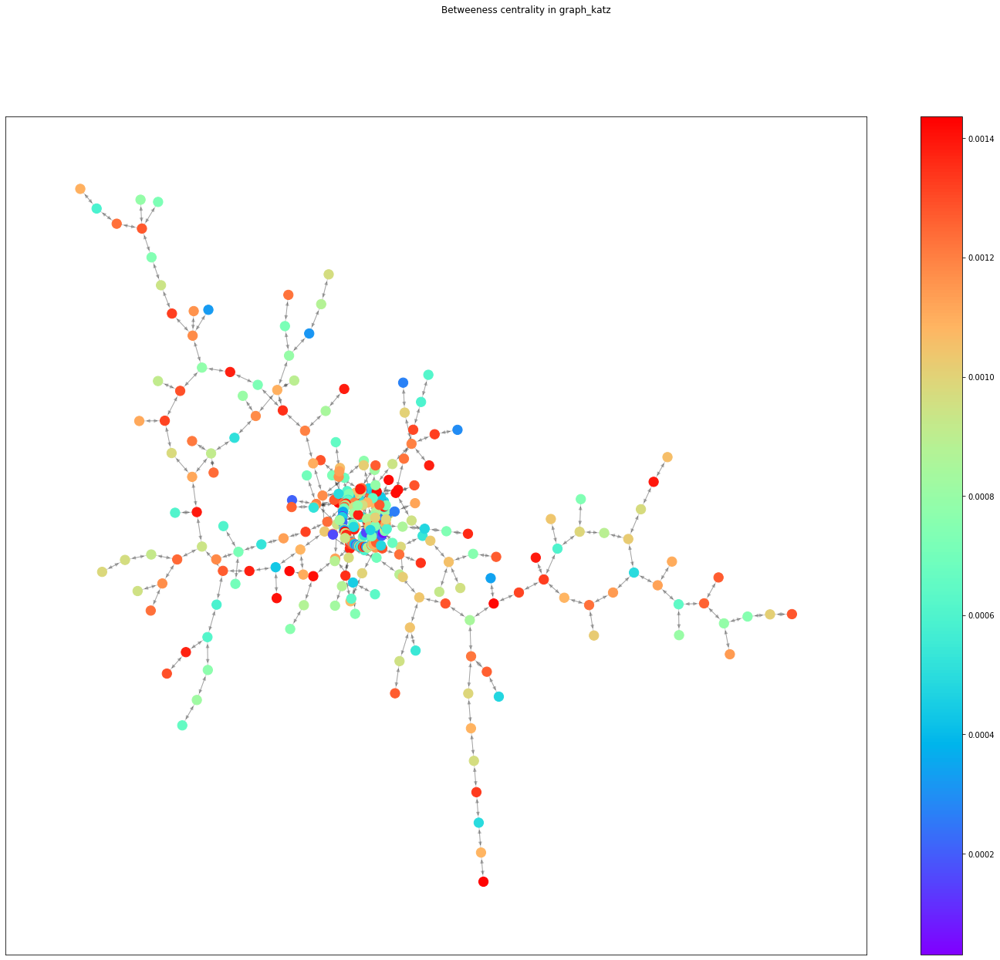

In [48]:
att = nx.get_node_attributes(graph_katz, "between")
nodes = graph_katz.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_katz)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Betweeness centrality in graph_katz")
node_col = nx.draw_networkx_nodes(graph_katz, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_katz, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality_graph_katz.png")

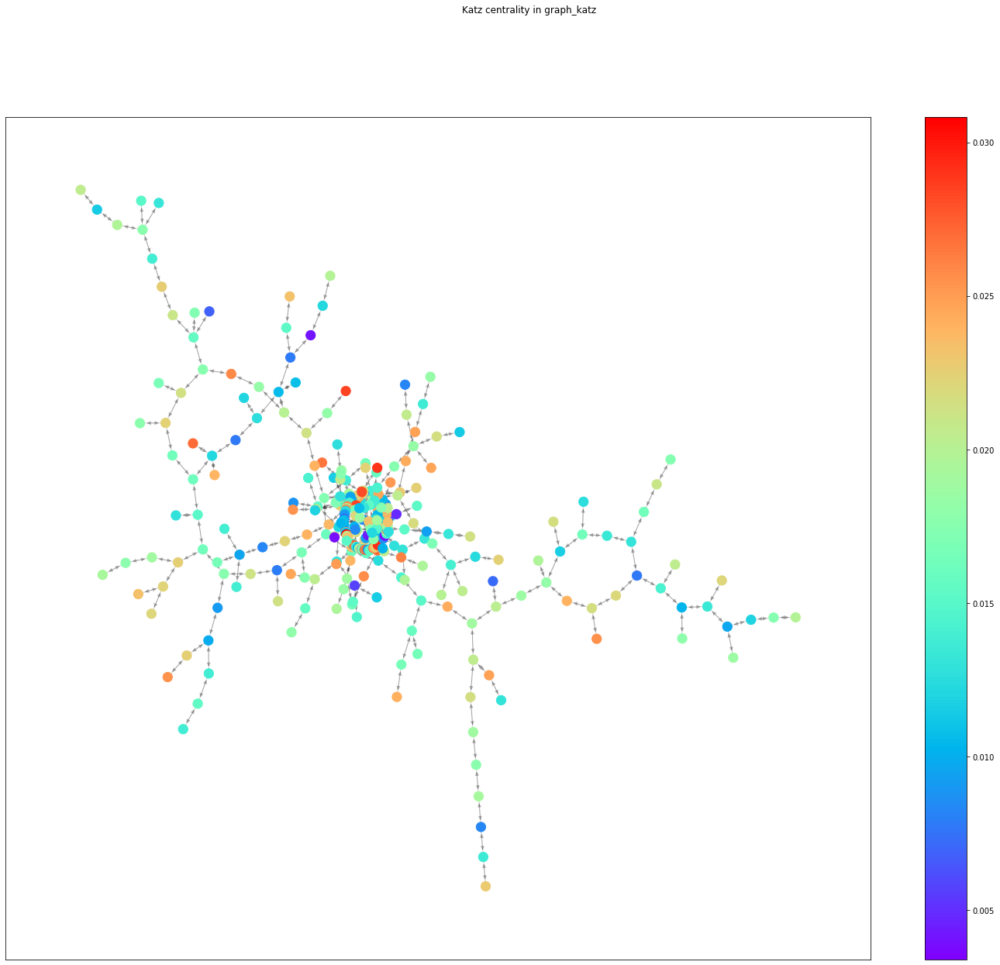

In [49]:
att = nx.get_node_attributes(graph_katz, "katz")
nodes = graph_katz.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_katz)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Katz centrality in graph_katz")
node_col = nx.draw_networkx_nodes(graph_katz, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_katz, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Katz_centrality_graph_katz.png")

<Figure size 432x288 with 0 Axes>

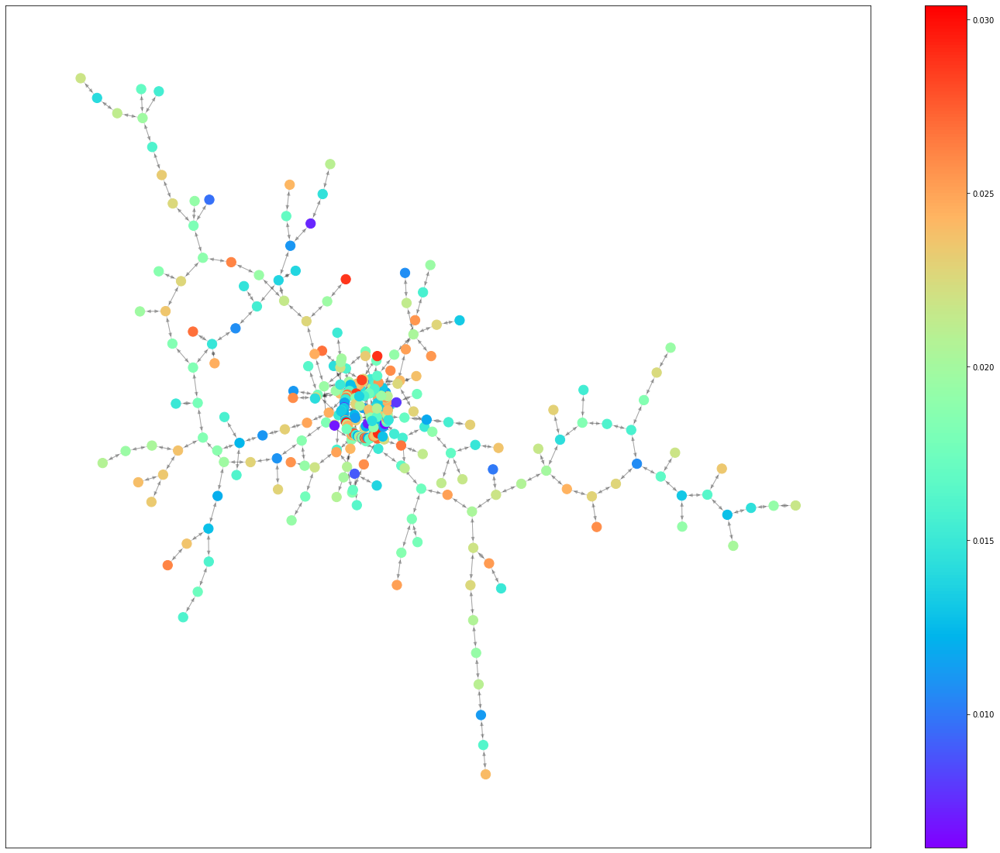

In [50]:
#Eigenvector centrality
att = nx.get_node_attributes(graph_katz, "eigen")
nodes = graph_katz.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_katz)
plt.suptitle("Eigenvector centrality in graph_katz")
fig = plt.figure(figsize=(25, 20))
node_col = nx.draw_networkx_nodes(graph_katz, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_katz, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality_graph_katz.png")

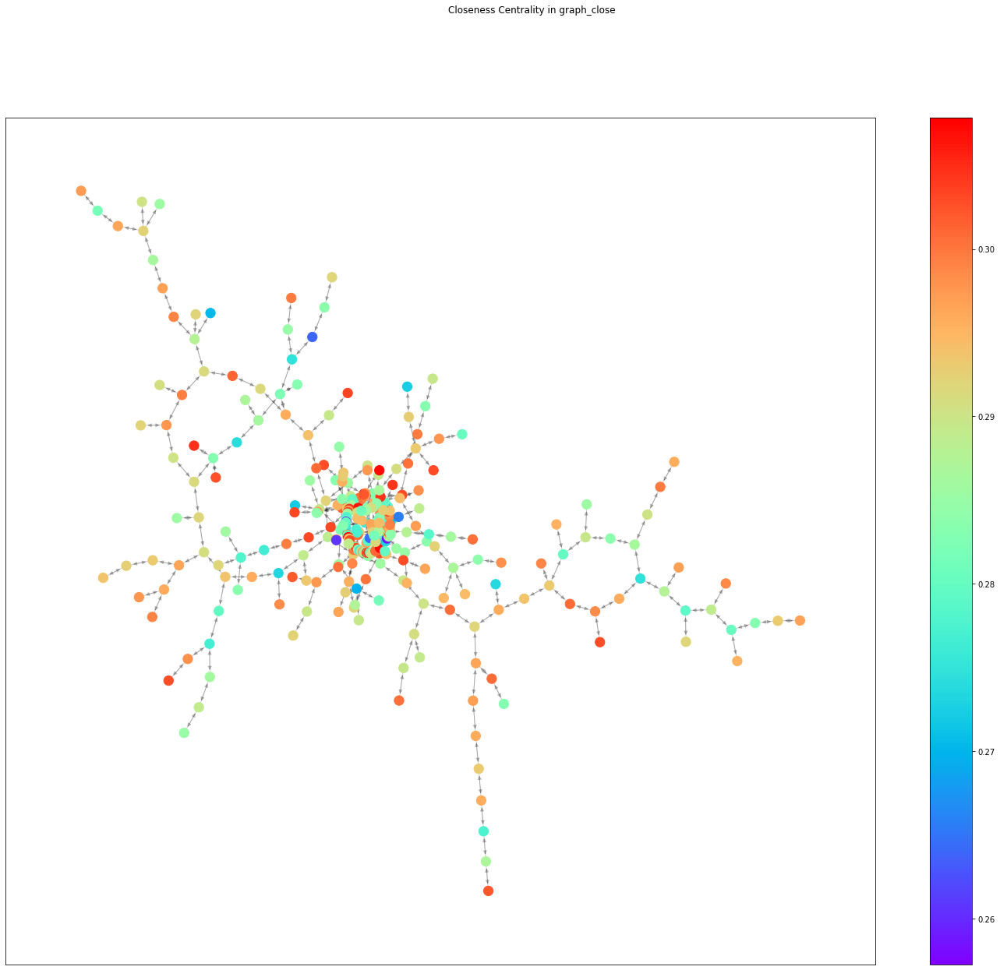

In [51]:
att = nx.get_node_attributes(graph_katz, "close")
nodes = graph_katz.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_katz)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Closeness Centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_katz, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_katz, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality.png")

In [52]:
density = nx.density(graph_close)
print("The graph_close diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph_close, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph_close, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph_close, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph_close, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph_close, "eigen"))

The graph_close diameter:     5
Density:                0.0034989813092390822
Shortest path length:   3.273137137137137
Degree Centrality:      2.502502502502499
Closeness centrality:   60.96937660878829
Betweeness Centrality:  0.15272709754981095
Katz Centrality:        3.1381732414557066
EigenVector centrality: 3.5518385691107923


# EigenVector Centrality Analysis

In [53]:
eigen_cent_nodes = extract(graph, "eigen", 0.8)

In [54]:
removed = len(graph) - len(eigen_cent_nodes)
print("We removed", removed, "nodes from graph")

We removed 318 nodes from graph


In [55]:
graph_eigen = graph.copy()
graph_eigen.remove_nodes_from(eigen_cent_nodes)

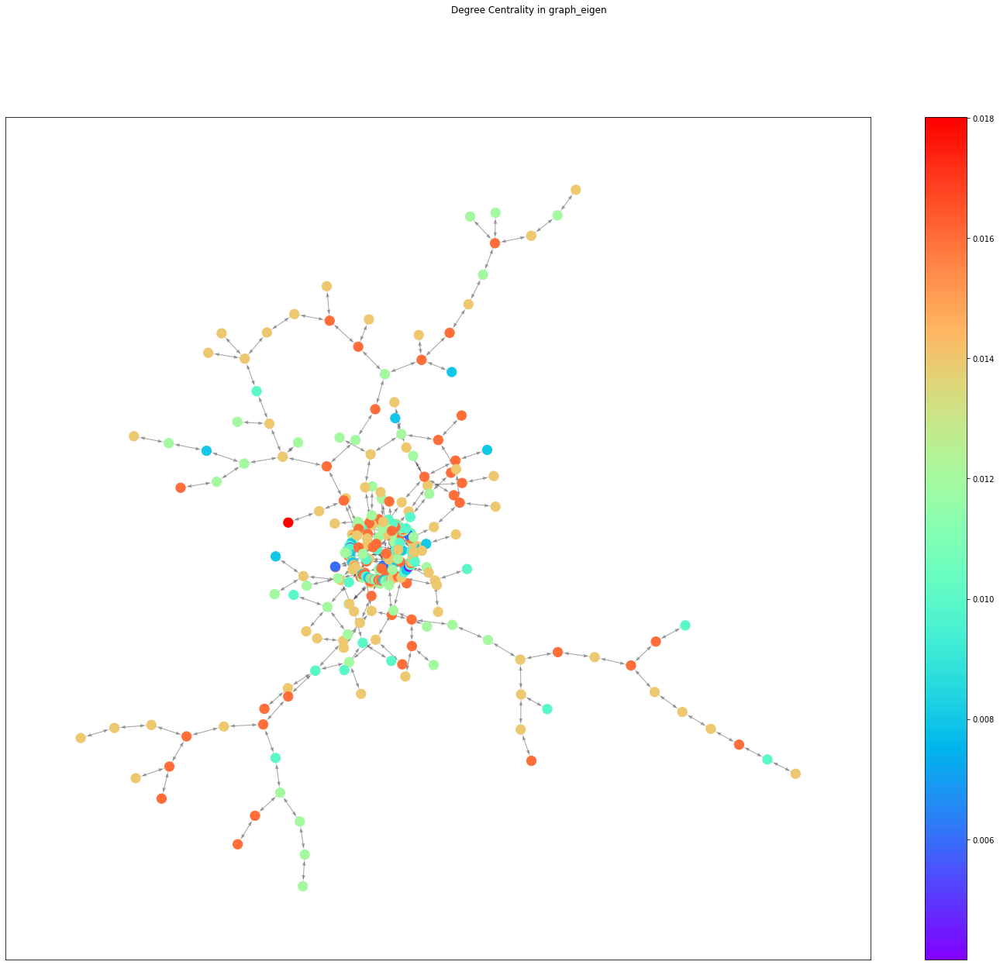

In [56]:
att = nx.get_node_attributes(graph_eigen, "degree")
nodes = graph_eigen.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_eigen)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Degree Centrality in graph_eigen")
node_col = nx.draw_networkx_nodes(graph_eigen, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_eigen, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Degree_centrality_graph_eigen.png")

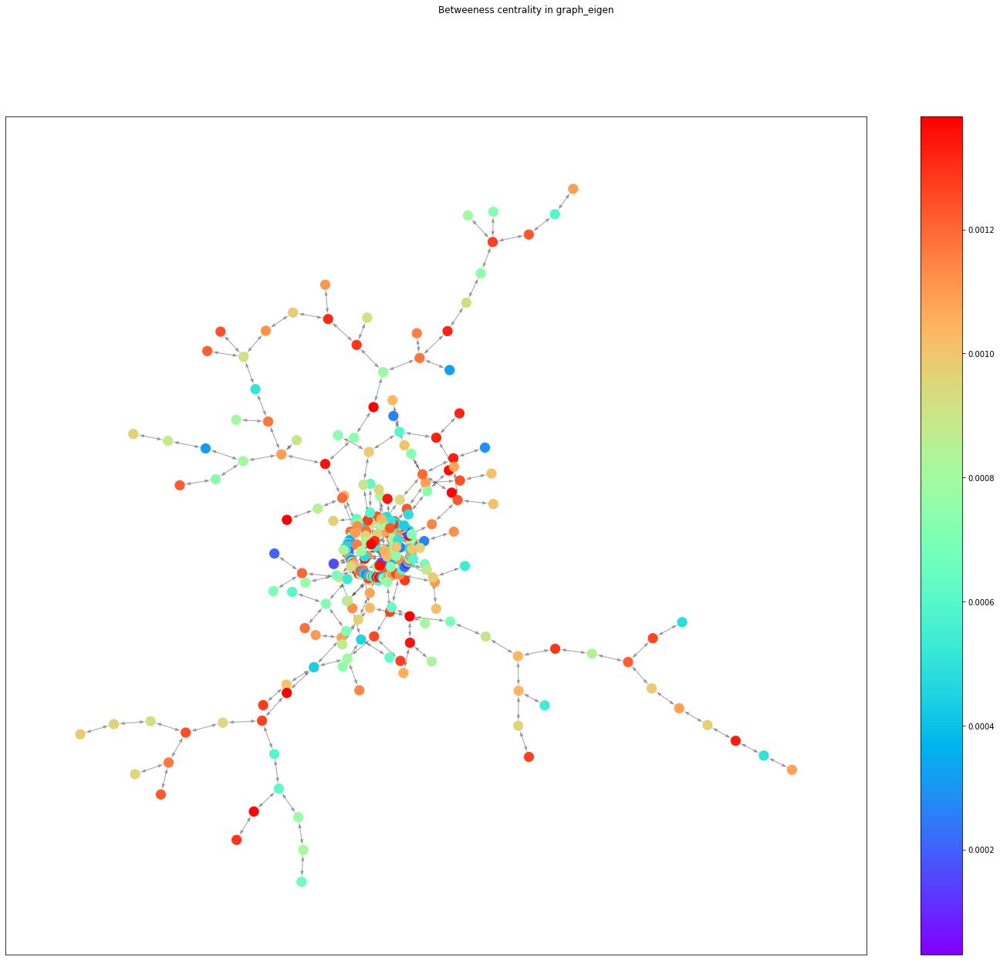

In [57]:
att = nx.get_node_attributes(graph_eigen, "between")
nodes = graph_eigen.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_eigen)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Betweeness centrality in graph_eigen")
node_col = nx.draw_networkx_nodes(graph_eigen, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_eigen, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Between_centrality_graph_eigen.png")

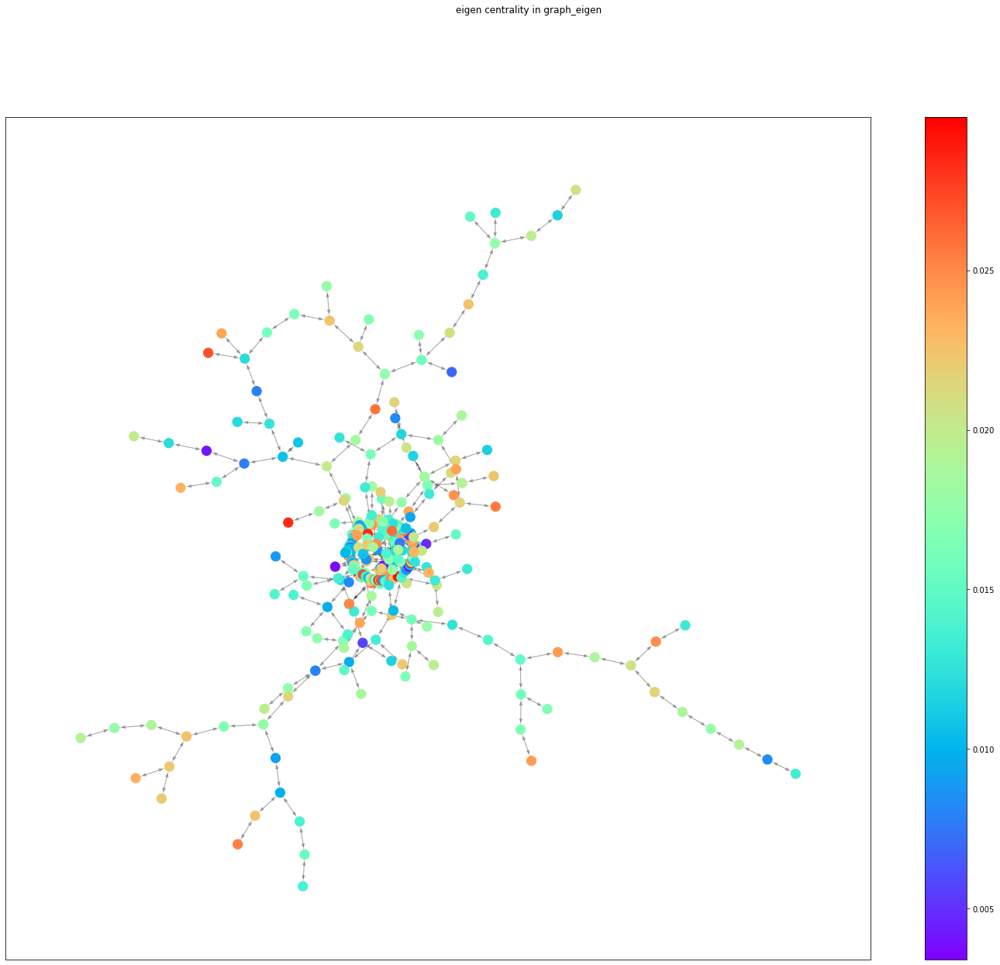

In [58]:
att = nx.get_node_attributes(graph_eigen, "katz")
nodes = graph_eigen.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_eigen)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("eigen centrality in graph_eigen")
node_col = nx.draw_networkx_nodes(graph_eigen, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_eigen, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("eigen_centrality_graph_eigen.png")

<Figure size 432x288 with 0 Axes>

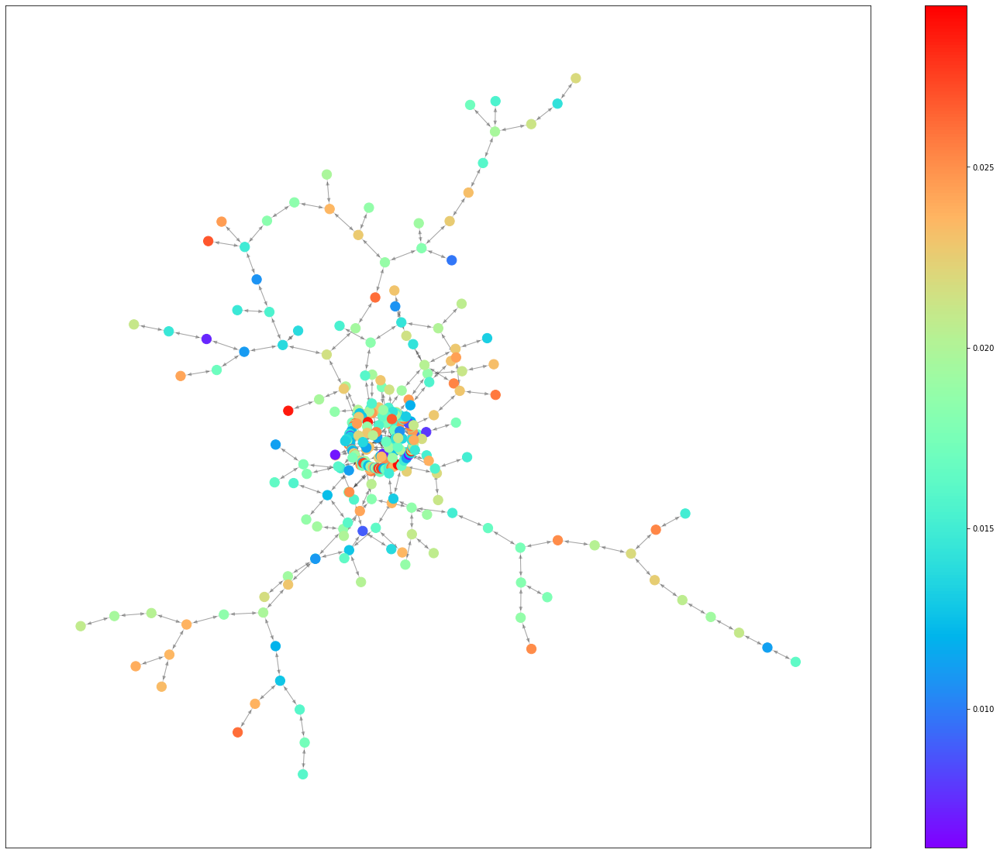

In [59]:
#Eigenvector centrality
att = nx.get_node_attributes(graph_eigen, "eigen")
nodes = graph_eigen.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_eigen)
plt.suptitle("Eigenvector centrality in graph_eigen")
fig = plt.figure(figsize=(25, 20))
node_col = nx.draw_networkx_nodes(graph_eigen, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_eigen, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Eigen_centrality_graph_eigen.png")

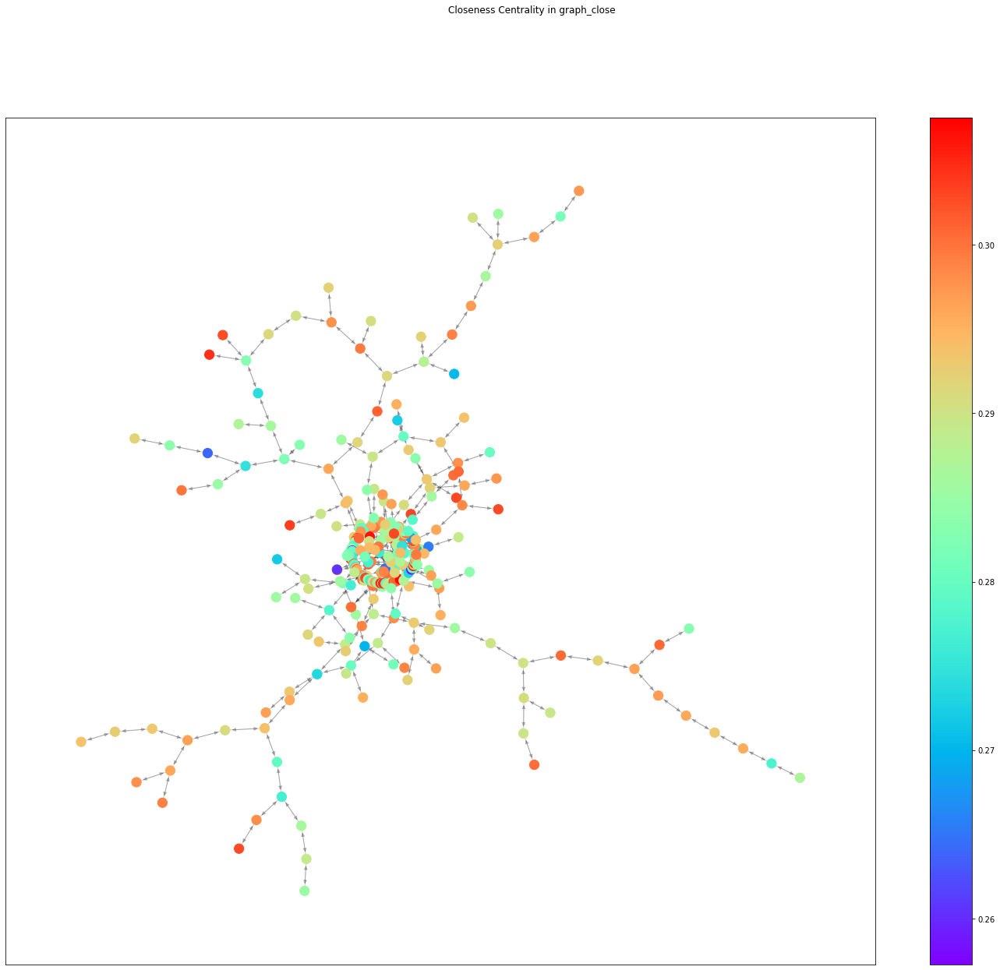

In [60]:
att = nx.get_node_attributes(graph_eigen, "close")
nodes = graph_eigen.nodes()
colors = [att[n] for n in nodes]
layout = nx.kamada_kawai_layout(graph_eigen)
fig = plt.figure(figsize=(25, 20))
fig.suptitle("Closeness Centrality in graph_close")
node_col = nx.draw_networkx_nodes(graph_eigen, layout, fig=fig, nodelist=nodes, node_color=colors,node_size=150, cmap=plt.cm.rainbow)
edge_col = nx.draw_networkx_edges(graph_eigen, layout, fig=fig, alpha=0.2)
fig.colorbar(node_col)
plt.savefig("Close_centrality.png")

In [61]:
density = nx.density(graph_eigen)
print("The graph_eigen diameter:    ", diameter)
print("Density:               ", density)
print("Shortest path length:  ", sh_path_length)
print("Degree Centrality:     ", cum_sum_attr(graph_eigen, "degree"))
print("Closeness centrality:  ", cum_sum_attr(graph_eigen, "close"))
print("Betweeness Centrality: ", cum_sum_attr(graph_eigen, "between"))
print("Katz Centrality:       ", cum_sum_attr(graph_eigen, "katz"))
print("EigenVector centrality:", cum_sum_attr(graph_eigen, "eigen"))

The graph_eigen diameter:     5
Density:                0.0041267384877884256
Shortest path length:   3.273137137137137
Degree Centrality:      4.122122122122123
Closeness centrality:   92.2082119978657
Betweeness Centrality:  0.28281274021136943
Katz Centrality:        5.376479430681673
EigenVector centrality: 5.93140458049938
